In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
%matplotlib inline
from ydata_profiling import ProfileReport

int_fijo_vel

Acceso a Internet Fijo por rangos de velocidad de bajada y provincia

Número de accesos al servicio de Internet fijo por velocidad de bajada en cada provincia (trimestral)

In [2]:
df = pd.read_csv("data_original\Internet_Accesos-por-velocidad.csv")

#Visualizar dataframe

In [12]:
df

,Año,Trimestre,Provincia,HASTA 512 kbps,+ 512 Kbps - 1 Mbps,+ 1 Mbps - 6 Mbps,+ 6 Mbps - 10 Mbps,+ 10 Mbps - 20 Mbps,+ 20 Mbps - 30 Mbps,+ 30 Mbps,OTROS,Total
0,2022,3,Buenos Aires,29.985,27.709,290315.0,297.915,267.044,124.190,3618689.0,65.821,4721668.0
1,2022,3,Capital Federal,517.000,5.742,34371.0,67.829,51.946,28.692,1253105.0,105.477,1547679.0
2,2022,3,Catamarca,71.000,384.000,3107.0,5.389,5.099,3.737,50298.0,2.208,70293.0
3,2022,3,Chaco,461.000,987.000,16782.0,18.938,8.049,15.828,79390.0,3.711,144146.0
4,2022,3,Chubut,109.000,1.444,45707.0,30.940,34.682,15.309,17563.0,20.024,165778.0
...,...,...,...,...,...,...,...,...,...,...,...,...
835,2014,1,Santa Cruz,161.000,1.625,24972.0,1.000,1.000,0.000,0.0,0.000,26760.0
836,2014,1,Santa Fe,8.456,124.468,345225.0,20.328,6.845,23.000,668.0,0.000,506013.0
837,2014,1,Santiago Del Estero,1.234,10.531,22817.0,2.422,109.000,0.000,0.0,0.000,37113.0
838,2014,1,Tierra Del Fuego,12.000,607.000,30902.0,6.000,0.000,0.000,0.0,0.000,31527.0


In [4]:
df.info()#visualizar cantidad de columnas, filas tipo de datos

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Año                  840 non-null    int64  
 1   Trimestre            840 non-null    int64  
 2   Provincia            840 non-null    object 
 3   HASTA 512 kbps       840 non-null    float64
 4   + 512 Kbps - 1 Mbps  840 non-null    float64
 5   + 1 Mbps - 6 Mbps    840 non-null    object 
 6   + 6 Mbps - 10 Mbps   840 non-null    float64
 7   + 10 Mbps - 20 Mbps  840 non-null    float64
 8   + 20 Mbps - 30 Mbps  840 non-null    float64
 9   + 30 Mbps            840 non-null    object 
 10  OTROS                834 non-null    float64
 11  Total                840 non-null    object 
dtypes: float64(6), int64(2), object(4)
memory usage: 78.9+ KB


 Remover los puntos 

In [5]:
df['+ 1 Mbps - 6 Mbps'] = df['+ 1 Mbps - 6 Mbps'].str.replace('.', '').astype(float)
df['+ 30 Mbps'] = df['+ 30 Mbps'].str.replace('.', '').astype(float)
df['Total'] = df['Total'].str.replace('.', '').astype(float)


In [6]:
# cambios de tipo de tipo de datos de columna
df['+ 1 Mbps - 6 Mbps'] = df['+ 1 Mbps - 6 Mbps'].astype(float)
df['+ 30 Mbps'] = df['+ 30 Mbps'].astype(float)
df['Total'] = df['Total'].astype(float)
df['Trimestre'] = df['Trimestre'].astype('category')
df['Año'] = df['Año'].astype('str')

In [7]:
df.info()#comprobar cambios

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840 entries, 0 to 839
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Año                  840 non-null    object  
 1   Trimestre            840 non-null    category
 2   Provincia            840 non-null    object  
 3   HASTA 512 kbps       840 non-null    float64 
 4   + 512 Kbps - 1 Mbps  840 non-null    float64 
 5   + 1 Mbps - 6 Mbps    840 non-null    float64 
 6   + 6 Mbps - 10 Mbps   840 non-null    float64 
 7   + 10 Mbps - 20 Mbps  840 non-null    float64 
 8   + 20 Mbps - 30 Mbps  840 non-null    float64 
 9   + 30 Mbps            840 non-null    float64 
 10  OTROS                834 non-null    float64 
 11  Total                840 non-null    float64 
dtypes: category(1), float64(9), object(2)
memory usage: 73.3+ KB


In [8]:
df.describe()#resumen estadistico

,HASTA 512 kbps,+ 512 Kbps - 1 Mbps,+ 1 Mbps - 6 Mbps,+ 6 Mbps - 10 Mbps,+ 10 Mbps - 20 Mbps,+ 20 Mbps - 30 Mbps,+ 30 Mbps,OTROS,Total
count,840.000000,840.000000,8.400000e+02,840.000000,840.000000,840.000000,8.400000e+02,834.000000,8.400000e+02
mean,126.009998,101.790393,1.509700e+05,71.417265,79.988627,100.758158,7.917956e+04,32.937064,3.439888e+05
std,187.578607,207.396126,3.481538e+05,140.324223,170.586599,208.683467,3.426234e+05,128.937905,7.373366e+05
min,1.007000,0.000000,2.842000e+03,0.000000,0.000000,0.000000,0.000000e+00,-1.945000,1.240600e+04
25%,10.000000,3.362500,2.853925e+04,5.357250,4.872000,2.019000,7.000000e+00,0.000000,5.232825e+04
50%,50.000000,8.788000,4.883450e+04,20.157000,14.965500,11.251500,8.825000e+02,0.000000,1.043330e+05
75%,134.000000,84.340500,8.689750e+04,62.225500,55.093000,64.286250,1.966075e+04,7.497750,1.775798e+05
max,998.000000,999.000000,2.299705e+06,917.000000,978.000000,997.000000,3.618689e+06,923.000000,4.721668e+06


La velocidad  deacceso desde  512 Mbps kbps hasta 30 Mbps


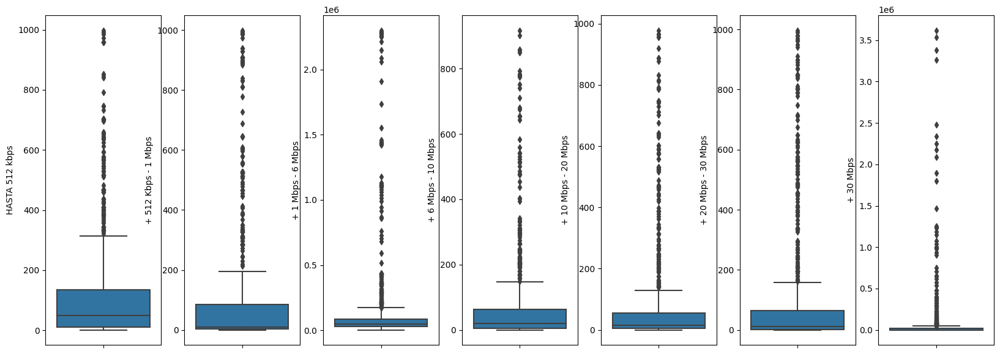

In [16]:
fig=plt.figure(figsize=(20,7))

ax1=fig.add_subplot(171)
ax2=fig.add_subplot(172)
ax3=fig.add_subplot(173)
ax4=fig.add_subplot(174)
ax5=fig.add_subplot(175)
ax6=fig.add_subplot(176)
ax7=fig.add_subplot(177)

sns.boxplot(data=df,y='HASTA 512 kbps',ax=ax1);
sns.boxplot(data=df,y='+ 512 Kbps - 1 Mbps',ax=ax2);
sns.boxplot(data=df,y='+ 1 Mbps - 6 Mbps',ax=ax3);
sns.boxplot(data=df,y='+ 6 Mbps - 10 Mbps',ax=ax4);
sns.boxplot(data=df,y='+ 10 Mbps - 20 Mbps',ax=ax5);
sns.boxplot(data=df,y='+ 20 Mbps - 30 Mbps',ax=ax6);
sns.boxplot(data=df,y='+ 30 Mbps',ax=ax7);

Los valores maximos llegan alrededor de 1 millon aprox.

El servicio de velocidad mas usada es el de  hasta 30 kbps



c:\Users\ROG BY NG\Desktop\Proyecto2_DataAnalitics\venv\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


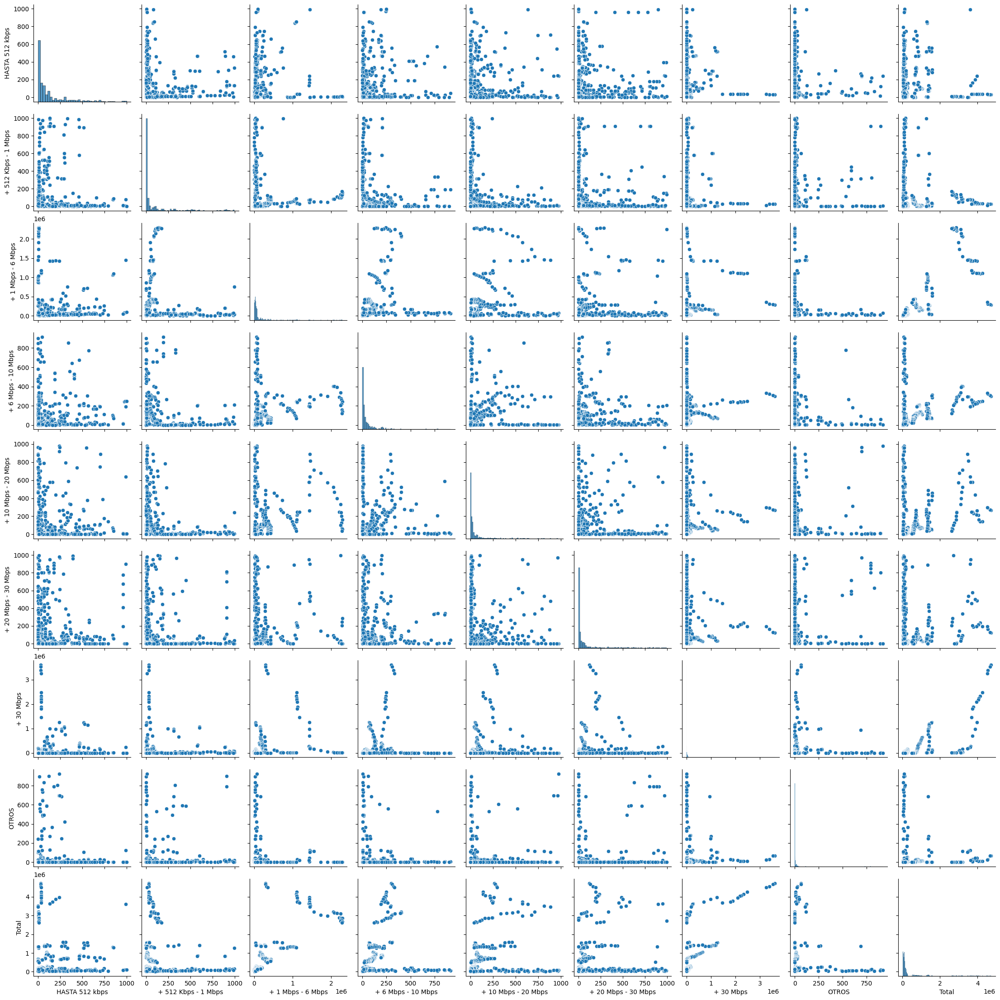

In [14]:
sns.pairplot(data=df)

Es observan valores extremos en todos los casos 

In [13]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Conclusiones
_No se observan valores nulos ni faltantes

_El servicio de velocidad mas usada es el de  512 kbps 

_Se obsevan valores extremos en las culumnas numericas

_+ 1 Mbps - 6 Mbps está altamente correlacionado  con + 6 Mbps - 10 Mbps y 1 otros campos Alta correlación

_+ 6 Mbps - 10 Mbps está altamente correlacionado  con + 1 Mbps - 6 Mbps y 1 otros campos Alta correlación

_se contabizaron 24 provincias 

_Los registro son desde el año 2014 hasta el 3er trimestre de 2022


In [17]:
#importar df
df.to_csv('int__fijo_vel.csv', index=False)